# Imports and Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matching_functions import *
from viz_tools import *

plt.rcParams['font.size'] = 11
plt.rcParams['font.family'] = 'serif'

## Exploring Swap Best Algorithm with a specific seed

In [2]:
SEED = 45
n = 30
p = 0.9

X, Y = generate_random_points(n)

# Compute matchings
optimal, o = compute_optimal(X, Y, p)
greedy, g = compute_greedy(X, Y)
final, num_swaps, history = compute_swap_best(X, Y, p, greedy)

opt_cost = compute_cost(X, Y, optimal, p)

print(f"Seed {SEED}: {num_swaps} total swaps")
print(f"Reached optimal: {matchings_equal(final, optimal)}")

Seed 45: 10 total swaps
Reached optimal: True


Left: cost = 4.246808
Right: cost = 3.883735
Difference: 0.363072


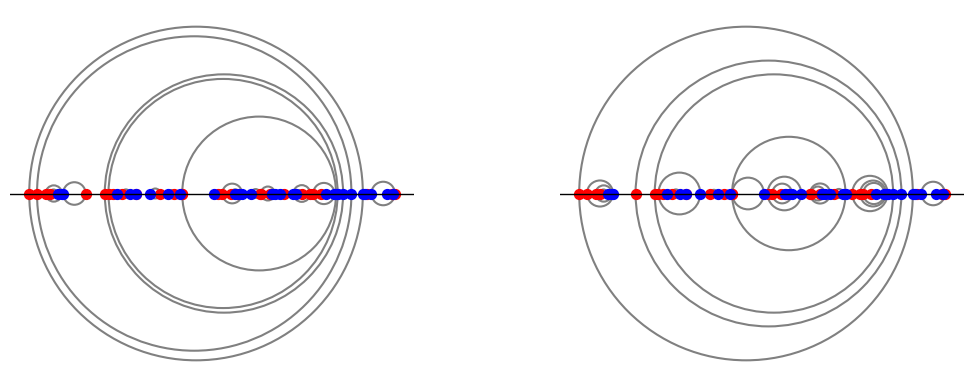

In [3]:
# Compare no swaps with optimal
plot_two_matchings(X, Y, p, history[0], optimal)

Left: cost = 3.883735
Right: cost = 3.883735
Difference: 0.000000


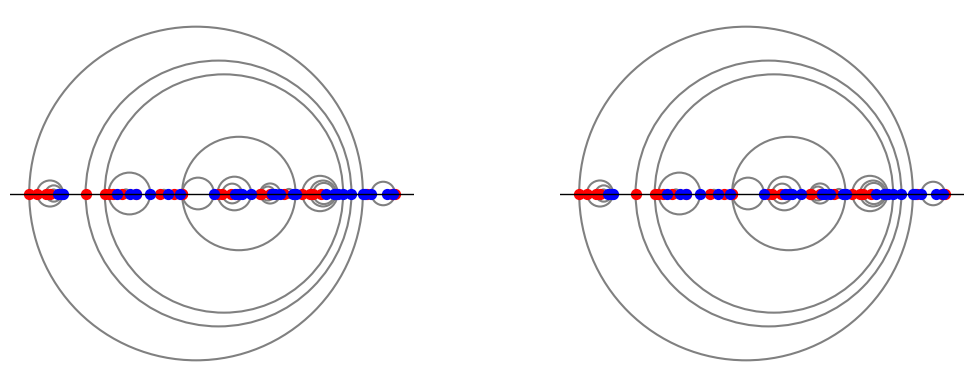

In [4]:
# Compare after swaps with optimal
plot_two_matchings(X, Y, p, history[-1], optimal)

## Finding local minima for greedy with swaps

In [5]:
n = 10
p = 0.9
max_attempts = 1000000000

found_seed = None
greedy = False # Set to False to use Dyck initialization
X, Y

for attempt in range(1, max_attempts + 1):
    seed = np.random.randint(1, 1000000000)

    X, Y = generate_random_points(n)
    optimal, o = compute_optimal(X, Y, p)

    if greedy:
      greedy, g = compute_greedy(X, Y)
      final, num_swaps, history = compute_swap_best(X, Y, p, greedy)
    else:
      dyck, d = compute_dyck(X, Y)
      final, num_swaps, history = compute_swap_best(X, Y, p, dyck)

    # is_optimal = matchings_equal(final, optimal)
    final_cost = compute_cost(X, Y, final, p)
    opt_cost = compute_cost(X, Y, optimal, p)
    cost_gap = final_cost - opt_cost
    is_optimal = (cost_gap < 1e-10) # use cost to determine optimality instead of comparing the matchings

    print(f"{attempt}. seed: {seed}, swaps: {num_swaps}, gap: {cost_gap:.6f}, optimal: {'yes' if is_optimal else 'no'}")

    if not is_optimal:
        found_seed = seed
        print(f"\nNon-optimal case found at seed {found_seed}")
        break

1. seed: 774988077, swaps: 1, gap: 0.000000, optimal: yes
2. seed: 769209090, swaps: 0, gap: 0.000000, optimal: yes
3. seed: 393006552, swaps: 0, gap: 0.000000, optimal: yes
4. seed: 67290176, swaps: 0, gap: 0.000000, optimal: yes
5. seed: 700767963, swaps: 0, gap: 0.000000, optimal: yes
6. seed: 679304584, swaps: 0, gap: 0.000000, optimal: yes
7. seed: 340457242, swaps: 2, gap: 0.000000, optimal: yes
8. seed: 242649347, swaps: 2, gap: 0.000000, optimal: yes
9. seed: 269484684, swaps: 0, gap: 0.000000, optimal: yes
10. seed: 11191172, swaps: 0, gap: 0.000000, optimal: yes
11. seed: 342544384, swaps: 0, gap: 0.000000, optimal: yes
12. seed: 20940430, swaps: 1, gap: 0.000000, optimal: yes
13. seed: 157485287, swaps: 0, gap: -0.000000, optimal: yes
14. seed: 995760732, swaps: 1, gap: -0.000000, optimal: yes
15. seed: 304681940, swaps: 0, gap: 0.000000, optimal: yes
16. seed: 516158801, swaps: 0, gap: 0.000000, optimal: yes
17. seed: 894934050, swaps: 1, gap: 0.000000, optimal: yes
18. see

In [6]:
# Exploring non-optimal case
# X, Y = generate_random_points(n)
optimal, o = compute_optimal(X, Y, p)
if greedy:
    greedy, g = compute_greedy(X, Y)
    final, num_swaps, history = compute_swap_best(X, Y, p, greedy)
else:
  dyck, d = compute_dyck(X, Y)
  final, num_swaps, history = compute_swap_best(X, Y, p, dyck)

Left: cost = 1.707756
Right: cost = 1.696074
Difference: 0.011682


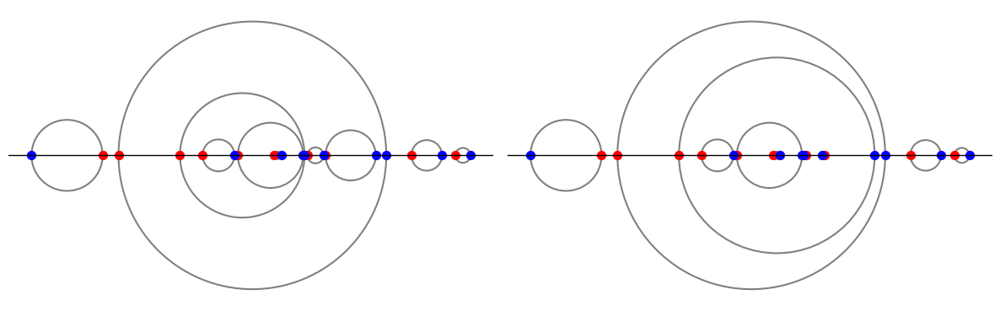

In [7]:
# Compare matchings at local vs global minimum
plot_two_matchings(X, Y, p, history[-1], optimal)

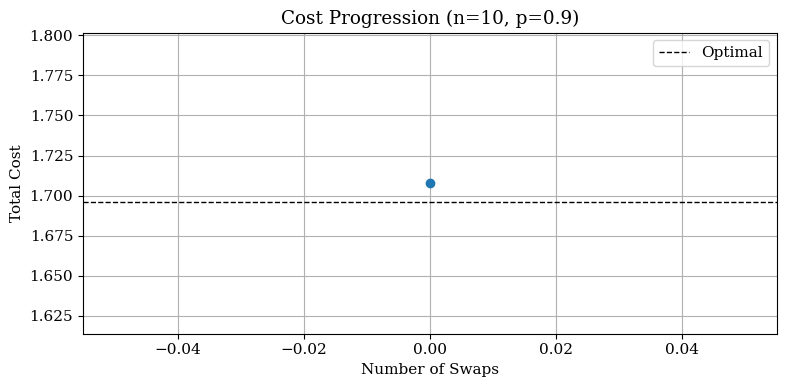

In [8]:
plot_cost_progression(history, X, Y, p, optimal)

## Finding local minima for Dyck with swaps

In [9]:
n = 10
p = 0.1
max_attempts = 1000000000

found_seed = None
X, Y

for attempt in range(1, max_attempts + 1):
    seed = np.random.randint(1, 1000000000)

    X, Y = generate_random_points(n)
    optimal, o = compute_optimal(X, Y, p)
    dyck, d = compute_dyck(X, Y)
    final, num_swaps, history = compute_swap_best(X, Y, p, dyck)

    is_optimal = matchings_equal(final, optimal)
    final_cost = compute_cost(X, Y, final, p)
    opt_cost = compute_cost(X, Y, optimal, p)
    cost_gap = final_cost - opt_cost

    print(f"{attempt}. seed: {seed}, swaps: {num_swaps}, gap: {cost_gap:.6f}, optimal: {'yes' if is_optimal else 'no'}")

    if not is_optimal:
        found_seed = seed
        print(f"\nNon-optimal case found at seed {found_seed}")
        break

1. seed: 301181378, swaps: 2, gap: 0.000000, optimal: yes
2. seed: 878053365, swaps: 1, gap: 0.000000, optimal: yes
3. seed: 303207430, swaps: 1, gap: 0.000000, optimal: yes
4. seed: 23344276, swaps: 2, gap: 0.000000, optimal: yes
5. seed: 120259924, swaps: 1, gap: 0.000000, optimal: yes
6. seed: 434287442, swaps: 0, gap: 0.000000, optimal: yes
7. seed: 222571956, swaps: 1, gap: 0.000000, optimal: yes
8. seed: 883053538, swaps: 1, gap: 0.000000, optimal: yes
9. seed: 726791166, swaps: 1, gap: 0.000000, optimal: yes
10. seed: 889514392, swaps: 1, gap: 0.000000, optimal: yes
11. seed: 919877542, swaps: 3, gap: 0.000000, optimal: yes
12. seed: 994123572, swaps: 2, gap: 0.000000, optimal: yes
13. seed: 15458565, swaps: 1, gap: 0.000000, optimal: yes
14. seed: 595974712, swaps: 2, gap: 0.000000, optimal: yes
15. seed: 504321475, swaps: 1, gap: 0.000000, optimal: yes
16. seed: 138700463, swaps: 3, gap: 0.000000, optimal: yes
17. seed: 269155720, swaps: 1, gap: 0.000000, optimal: yes
18. seed

In [10]:
# Exploring non-optimal case
optimal, o = compute_optimal(X, Y, p)
dyck, d = compute_dyck(X, Y)
final, num_swaps, history = compute_swap_best(X, Y, p, dyck)

Left: cost = 7.028379
Right: cost = 7.017998
Difference: 0.010380


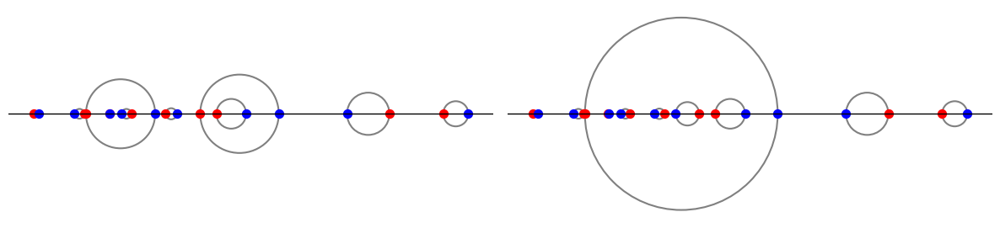

In [11]:
# Compare matchings at local vs global minimum
plot_two_matchings(X, Y, p, history[-1], optimal)

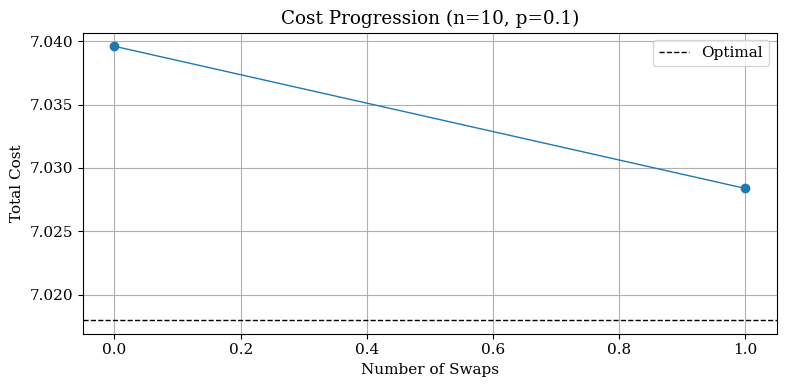

In [12]:
plot_cost_progression(history, X, Y, p, optimal)

In [13]:
# ### Animated version of the above (hopefully) (gonna work on this not!today)
import matplotlib.animation as animation
from IPython.display import HTML

# Parameters
n = 100
p = 0.5
seed = 336194758 #np.random.randint(1, 1000000000)

# Generate points and optimal matching once
X, Y = generate_random_points(n)
optimal, o = compute_optimal(X, Y, p)
opt_cost = compute_cost(X, Y, optimal, p)

# Generate the base plot and the red/blue points
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# List of circles for each subplot
hybrid_circles = []
opt_circles = []

for ax, circles in [(axes[0], hybrid_circles), (axes[1], opt_circles)]:
    ax.axhline(0, color='k', linewidth=1)

    max_r = 0
    for i, j in optimal:
        radius = abs(Y[j] - X[i]) / 2
        max_r = max(max_r, radius)

    y_lim = max(max_r * 1.1, 0.15)
    ax.set_ylim(-y_lim, y_lim)
    ax.set_xlim(min(np.min(X), np.min(Y)) - 0.05,
                max(np.max(X), np.max(Y)) + 0.05)
    ax.set_aspect('equal')
    ax.axis('off')

    for _ in range(n):
        circle = Circle((0, 0), 1, fill=False, edgecolor='grey', linewidth=1.5)
        circles.append(circle)
        ax.add_patch(circle)

    ax.scatter(X, np.zeros_like(X), c='red', s=50)
    ax.scatter(Y, np.zeros_like(Y), c='blue', s=50)

# Initialize optimal circles
for i, (xi, yj) in enumerate(optimal):
    center = (X[xi] + Y[yj]) / 2
    radius = abs(Y[yj] - X[xi]) / 2
    opt_circles[i].center = (center, 0)
    opt_circles[i].set_radius(radius)

# Add title text objects
fig.suptitle(f'n={n}, p={p}, seed={seed}', fontsize=11)
left_title = axes[0].text(0.5, 1.05, '', transform=axes[0].transAxes, ha='center', fontsize=11)
right_title = axes[1].text(0.5, 1.05, f'Optimal: cost = {opt_cost:.6f}', transform=axes[1].transAxes, ha='center', fontsize=11)

plt.tight_layout()

# Function to update the animation each frame
def update(frame):
    k = frame
    hybrid, hybrid_cost = compute_hybrid(X, Y, p, k)

    # Update left title
    left_title.set_text(f'Hybrid (k={k}): cost = {hybrid_cost:.6f}')

    # Update hybrid circles
    for i in range(n):
        x_pt, y_pt = X[hybrid[i][0]], Y[hybrid[i][1]]
        center = (x_pt + y_pt) / 2
        radius = abs(x_pt - y_pt) / 2
        hybrid_circles[i].center = (center, 0)
        hybrid_circles[i].set_radius(radius)

    return hybrid_circles + [left_title]

# Generate and display the animation
ani = animation.FuncAnimation(fig=fig, func=update, frames=n+1, interval=100)
plt.close()  # Prevent static figure from displaying
HTML(ani.to_jshtml())

In [ ]:
# Brute force search for pathological seeds
n = 50
p = 0.5
max_attempts = 10000

found_seeds = []
for attempt in range(1, max_attempts + 1):
    seed = np.random.randint(1, 1000000000)
    X, Y = generate_random_points(n)

    greedy, g = compute_greedy(X, Y)
    dyck, d = compute_dyck(X, Y)
    greedy_cost = compute_cost(X, Y, greedy, p)
    dyck_cost = compute_cost(X, Y, dyck, p)
    min_pure = min(greedy_cost, dyck_cost)
    all_worse = True
    for k in range(1, n):
        fraction = k / n
        hybrid = compute_hybrid(X, Y, p, fraction)[0]
        hybrid_cost = compute_cost(X, Y, hybrid, p)
        if hybrid_cost <= min_pure - 1e-10:
            all_worse = False
            break

    if all_worse:
        found_seeds.append(seed)
        print(f"{attempt}. seed: {seed}, greedy: {greedy_cost:.6f}, dyck: {dyck_cost:.6f}")
        break

    if attempt % 100 == 0:
        print(f"{attempt}...")

print(f"\nPathological seeds: {found_seeds}")

TypeError: generate_random_points() got an unexpected keyword argument 'seed'

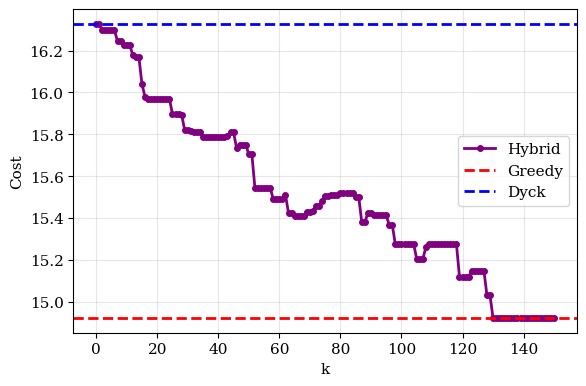

Greedy: 14.921165, Dyck: 16.328130, Best hybrid (k=132): 14.921165


In [ ]:
# cost varying k
seed = 593724313
n = 150
p = 0.5

X, Y = generate_random_points(n)
greedy, g = compute_greedy(X, Y)
dyck, d = compute_dyck(X, Y)
greedy_cost = compute_cost(X, Y, greedy, p)
dyck_cost = compute_cost(X, Y, dyck, p)

k_values = list(range(n + 1))
hybrid_costs = []
for k in k_values:
    hybrid, cost = compute_hybrid(X, Y, p, k)
    hybrid_costs.append(cost)

min_k = hybrid_costs.index(min(hybrid_costs))


fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(k_values, hybrid_costs, 'o-', linewidth=2, markersize=4, color='purple', label='Hybrid')
ax.axhline(greedy_cost, color='red', linestyle='--', linewidth=2, label='Greedy')
ax.axhline(dyck_cost, color='blue', linestyle='--', linewidth=2, label='Dyck')
ax.legend()
ax.set_xlabel('k')
ax.set_ylabel('Cost')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Greedy: {greedy_cost:.6f}, Dyck: {dyck_cost:.6f}, Best hybrid (k={min_k}): {hybrid_costs[min_k]:.6f}")

In [ ]:
# Numpy has ways to set a seed but I am lazy and use this hacky double seed method 
seed = 593724313
# seed = 736592580
# seed = 810204671
# random.seed(seed)
np.random.seed(seed)
n = 150
p = 0.5
k_values = list(range(n + 1))
normalized_costs = []
num_trials = 1

for _ in range(num_trials):
    # X, Y = generate_random_points(n, seed = random.randrange(0, 100000000))
    X, Y = generate_random_points(n)

    optimal, optimal_cost = compute_optimal(X, Y, p)

    hybrid_costs = compute_hybrid_costs_for_all_k(X, Y, p)

    dyck_cost = hybrid_costs[0]
    greedy_cost = hybrid_costs[-1]
    max_pure_translated = max(dyck_cost, greedy_cost) - optimal_cost
    min_k = hybrid_costs.index(min(hybrid_costs))

    # normalized_hybrid_costs = [(c - optimal_cost)/max_pure_translated for c in hybrid_costs]
    # normalized_dyck_cost = normalized_hybrid_costs[0]
    # normalized_greedy_cost = normalized_hybrid_costs[-1]
    # normalized_costs.append(normalized_hybrid_costs)
    
    normalized_costs.append(hybrid_costs)

fig, ax = plt.subplots(figsize=(6, 4))
for cost_list in normalized_costs:
    ax.plot(k_values, cost_list, '-', linewidth=2, markersize=4, color='purple')
ax.axhline(greedy_cost, color='red', linestyle='--', linewidth=2, label='Greedy')
ax.axhline(dyck_cost, color='blue', linestyle='--', linewidth=2, label='Dyck')
ax.axhline(optimal_cost, color='grey', linestyle='--', linewidth=2, label='Optimal')
ax.legend()
ax.set_xlabel('k')
ax.set_ylabel('Cost')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# print(f"Greedy: {greedy_cost:.6f}, Dyck: {dyck_cost:.6f}, Best hybrid (k={min_k}): {hybrid_costs[min_k]:.6f}")

TypeError: generate_random_points() got an unexpected keyword argument 'seed'